# 🇧🇩  🔢 Bengali Number Plate Detection 🚗 🔍

📦 Importing Required Libraries

In [1]:
import os
import glob
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.font_manager as fm
from ultralytics import YOLO
import cv2
import numpy as np
import random
import json

⚙️ Configuration and Hyperparameters

In [2]:
EPOCHS = 500
IMG_SIZE = 640
BATCH_SIZE = 32
CONF_THRESHOLD = 0.25
IOU_THRESHOLD = 0.45

Project_Name = 'num_plate'
RUN_NAME = 'YOLO12_evenv_'

TRAIN_PROJECT_NAME = Project_Name
TRAIN_RUN_NAME = 'train_'+RUN_NAME

PREDICT_PROJECT_NAME = Project_Name
PREDICT_RUN_NAME = 'prediction_'+RUN_NAME

num_images_to_predict = 10

DATASET_PATH = 'dataset/img-to-text/'
# DATASET_PATH = ''
YAML_FILE = DATASET_PATH + '/data.yaml'

## 🏋️ Training

🤖 Defining Model 📦

In [3]:
model = YOLO("yolov12n.pt", task='detect')

🧑‍🏫 Train the Model 🏃‍♂️

In [4]:
results = model.train(
    data=YAML_FILE,
    epochs=EPOCHS,
    imgsz=IMG_SIZE,
    batch=BATCH_SIZE,
    project=TRAIN_PROJECT_NAME,
    name=TRAIN_RUN_NAME,
    amp=True,
    patience=50,
    pretrained=True,
    optimizer='auto'
)

print("Training finished. Model saved to:", model.trainer.save_dir)

BEST_MODEL_PATH = os.path.join(model.trainer.save_dir, 'weights', 'best.pt')
print("Best model weights path:", BEST_MODEL_PATH)

New https://pypi.org/project/ultralytics/8.3.227 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.168 🚀 Python-3.12.3 torch-2.7.1+cu126 CUDA:0 (NVIDIA GeForce RTX 3060, 11913MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=dataset/img-to-text//data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=500, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov12n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train_YOLO12_evenv_, nbs=64, nms=

train: Scanning /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/img-to-text/train/labels... 1865 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1865/1865 [00:00<00:00, 1934.52it/s]

train: /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/img-to-text/train/images/159.jpeg: 1 duplicate labels removed
train: /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/img-to-text/train/images/197.jpeg: 1 duplicate labels removed
train: /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/img-to-text/train/images/289.jpg: 1 duplicate labels removed
train: /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/img-to-text/train/images/315.jpg: 2 duplicate labels removed
train: /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/img-to-text/train/images/320.jpg: 1 duplicate labels removed
train: /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/img-to-text/train/images/325.jpg: 1 duplicate labels removed
train: /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/img-to-text/train/image

train: New cache created: /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/img-to-text/train/labels.cache
val: Fast image access ✅ (ping: 0.1±0.0 ms, read: 129.8±77.1 MB/s, size: 199.2 KB)


val: Scanning /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/img-to-text/val/labels... 533 images, 0 backgrounds, 0 corrupt: 100%|██████████| 533/533 [00:00<00:00, 1252.35it/s]

val: /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/img-to-text/val/images/49.jpeg: 1 duplicate labels removed


val: New cache created: /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/img-to-text/val/labels.cache
Plotting labels to num_plate/train_YOLO12_evenv_/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.0005), 119 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to num_plate/train_YOLO12_evenv_
Starting training for 500 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/500      6.95G      1.946      5.453       1.68        468        640:  56%|█████▌    | 33/59 [00:13<00:10,  2.50it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
      1/500      7.02G      1.692      5.067      1.468        139        640: 100%|██████████| 59/59 [00:24<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.14it/s]

                   all        533       4442     0.0212     0.0311     0.0169     0.0114



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/500      6.82G      1.419      3.792      1.268        512        640:   7%|▋         | 4/59 [00:01<00:22,  2.50it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
      2/500      6.89G      1.415      2.825      1.333        125        640: 100%|██████████| 59/59 [00:23<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.07it/s]

                   all        533       4442       0.69     0.0658     0.0945     0.0561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/500      6.99G      1.389      2.195      1.348        449        640:   7%|▋         | 4/59 [00:01<00:21,  2.50it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
      3/500      7.03G      1.416      1.918      1.337         86        640: 100%|██████████| 59/59 [00:23<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.91it/s]


                   all        533       4442      0.769      0.138      0.151      0.088

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/500      6.83G      1.426      1.551      1.334        547        640:  97%|█████████▋| 57/59 [00:23<00:00,  2.48it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
      4/500       6.9G      1.425      1.544      1.334        139        640: 100%|██████████| 59/59 [00:23<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.87it/s]


                   all        533       4442       0.62      0.201      0.169     0.0921

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/500      6.87G      1.398      1.372      1.319        126        640: 100%|██████████| 59/59 [00:23<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.90it/s]


                   all        533       4442       0.67      0.213      0.225      0.133

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/500         7G      1.393       1.27      1.314        482        640:  49%|████▉     | 29/59 [00:11<00:12,  2.49it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
      6/500      7.07G      1.385       1.27      1.311        106        640: 100%|██████████| 59/59 [00:23<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.96it/s]

                   all        533       4442      0.685      0.263      0.281      0.178



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/500         7G      1.369      1.189      1.298        509        640:  68%|██████▊   | 40/59 [00:16<00:07,  2.51it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
      7/500      7.06G      1.369      1.191      1.298        148        640: 100%|██████████| 59/59 [00:23<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.93it/s]


                   all        533       4442        0.6      0.279      0.288      0.177

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/500      6.94G      1.388      1.211      1.346        401        640:   3%|▎         | 2/59 [00:00<00:23,  2.48it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
      8/500      7.01G      1.359      1.136      1.297        116        640: 100%|██████████| 59/59 [00:23<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.96it/s]

                   all        533       4442      0.554      0.398      0.366      0.226



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/500      7.01G      1.334      1.097      1.287        475        640:  95%|█████████▍| 56/59 [00:22<00:01,  2.50it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
      9/500      7.06G      1.336      1.101      1.287        143        640: 100%|██████████| 59/59 [00:23<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.00it/s]

                   all        533       4442      0.718      0.337      0.397      0.256



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/500      6.89G      1.332      1.055      1.289        125        640: 100%|██████████| 59/59 [00:23<00:00,  2.53it/s]
libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.00it/s]

                   all        533       4442      0.552       0.38      0.386      0.248



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/500      7.06G      1.335      1.029      1.302        127        640: 100%|██████████| 59/59 [00:23<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.04it/s]

                   all        533       4442      0.469      0.525      0.486       0.32



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/500      6.81G      1.321      1.012      1.288        497        640:  44%|████▍     | 26/59 [00:10<00:13,  2.49it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     12/500      6.88G      1.317          1       1.29        144        640: 100%|██████████| 59/59 [00:23<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.98it/s]

                   all        533       4442      0.673      0.458      0.543      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/500       6.9G      1.325     0.9869      1.307        475        640:  44%|████▍     | 26/59 [00:10<00:13,  2.49it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     13/500       6.9G      1.317     0.9768      1.294        482        640:  97%|█████████▋| 57/59 [00:22<00:00,  2.47it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     13/500      6.96G      1.316     0.9757      1.293        148        640: 100%|██████████| 59/59 [00:23<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.00it/s]

                   all        533       4442      0.586      0.555      0.569      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/500      7.14G      1.314     0.9413      1.283        139        640: 100%|██████████| 59/59 [00:23<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.98it/s]

                   all        533       4442      0.563      0.609      0.633      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/500      6.98G      1.312     0.9412      1.297        531        640:  66%|██████▌   | 39/59 [00:15<00:08,  2.46it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     15/500      7.03G      1.315     0.9439      1.299        129        640: 100%|██████████| 59/59 [00:23<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.01it/s]

                   all        533       4442      0.567      0.667      0.682      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/500      6.98G      1.305     0.9141      1.276        145        640: 100%|██████████| 59/59 [00:23<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.01it/s]

                   all        533       4442      0.575      0.649      0.684      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/500      7.02G      1.295     0.8923      1.263        550        640:  22%|██▏       | 13/59 [00:05<00:18,  2.46it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     17/500      7.06G      1.302     0.8891      1.284        136        640: 100%|██████████| 59/59 [00:23<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.03it/s]

                   all        533       4442      0.701      0.682       0.77      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/59 [00:00<?, ?it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     18/500      6.95G      1.305       0.87      1.284        168        640: 100%|██████████| 59/59 [00:23<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.03it/s]

                   all        533       4442      0.682      0.705      0.754      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/500       7.1G      1.298     0.8737      1.291        418        640:  32%|███▏      | 19/59 [00:07<00:16,  2.49it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     19/500       7.1G        1.3     0.8654      1.287        449        640:  75%|███████▍  | 44/59 [00:17<00:06,  2.48it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     19/500      7.14G      1.297     0.8616       1.28        178        640: 100%|██████████| 59/59 [00:23<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.01it/s]

                   all        533       4442      0.678      0.753       0.79      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/500      6.95G      1.294     0.8508      1.274        140        640: 100%|██████████| 59/59 [00:23<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.02it/s]

                   all        533       4442      0.591       0.69      0.728      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/500      7.02G      1.265     0.8268      1.266        491        640:   5%|▌         | 3/59 [00:01<00:22,  2.46it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     21/500      7.06G       1.29     0.8313      1.275        113        640: 100%|██████████| 59/59 [00:23<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.02it/s]

                   all        533       4442      0.746      0.715        0.8      0.552



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/500      6.88G       1.28     0.8315      1.265        519        640:  51%|█████     | 30/59 [00:12<00:11,  2.47it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     22/500      6.95G      1.281     0.8207      1.271        118        640: 100%|██████████| 59/59 [00:23<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.02it/s]

                   all        533       4442      0.809      0.772      0.867      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/500      6.96G      1.287      0.821       1.28        501        640:  69%|██████▉   | 41/59 [00:16<00:07,  2.46it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     23/500      7.01G      1.286     0.8172      1.284        110        640: 100%|██████████| 59/59 [00:23<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.04it/s]

                   all        533       4442      0.735      0.788      0.836      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/500      6.98G       1.27      0.802      1.261        527        640:  32%|███▏      | 19/59 [00:07<00:16,  2.49it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     24/500      7.04G      1.274     0.7974      1.266        135        640: 100%|██████████| 59/59 [00:23<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.03it/s]

                   all        533       4442      0.701      0.769      0.825      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/500      7.05G      1.272     0.7849      1.277         80        640: 100%|██████████| 59/59 [00:23<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.04it/s]

                   all        533       4442      0.837      0.805      0.893      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/500      6.99G      1.276     0.7744      1.258        525        640:  68%|██████▊   | 40/59 [00:16<00:07,  2.47it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     26/500      7.06G      1.271     0.7728       1.26        150        640: 100%|██████████| 59/59 [00:23<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.01it/s]

                   all        533       4442      0.764      0.808      0.866      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/500      7.02G      1.271     0.7769       1.26        521        640:  15%|█▌        | 9/59 [00:03<00:20,  2.46it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     27/500      7.06G      1.273      0.774      1.267        167        640: 100%|██████████| 59/59 [00:23<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.05it/s]

                   all        533       4442      0.804      0.853      0.912      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/500      6.88G      1.265     0.7639      1.271        478        640:  64%|██████▍   | 38/59 [00:15<00:08,  2.47it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     28/500      6.95G      1.264      0.758      1.272         91        640: 100%|██████████| 59/59 [00:23<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.00it/s]

                   all        533       4442      0.851      0.858      0.921      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/500      6.97G      1.261     0.7614      1.268        496        640:  42%|████▏     | 25/59 [00:10<00:13,  2.46it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     29/500      6.97G      1.264     0.7592      1.274        538        640:  73%|███████▎  | 43/59 [00:17<00:06,  2.46it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     29/500      7.02G      1.267     0.7566      1.277        116        640: 100%|██████████| 59/59 [00:23<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.04it/s]

                   all        533       4442      0.819      0.859      0.916      0.646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/500      6.82G      1.268      0.758      1.268        481        640:  95%|█████████▍| 56/59 [00:22<00:01,  2.46it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     30/500      6.89G      1.266     0.7555      1.266        117        640: 100%|██████████| 59/59 [00:23<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.04it/s]

                   all        533       4442      0.851      0.823      0.902      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/500      7.06G      1.251     0.7401       1.26        150        640: 100%|██████████| 59/59 [00:23<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.04it/s]

                   all        533       4442      0.828      0.851      0.906      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/500      6.92G      1.259     0.7243       1.26        458        640:  64%|██████▍   | 38/59 [00:15<00:08,  2.46it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     32/500      6.99G      1.261     0.7284      1.265        104        640: 100%|██████████| 59/59 [00:23<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.02it/s]

                   all        533       4442      0.868       0.85      0.917      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/500      7.02G      1.251     0.7274       1.26        608        640:  58%|█████▊    | 34/59 [00:13<00:10,  2.49it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     33/500      7.06G      1.253     0.7248      1.258        117        640: 100%|██████████| 59/59 [00:23<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.05it/s]

                   all        533       4442      0.885      0.854      0.926      0.655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/500      6.92G      1.246     0.7173      1.272        601        640:  22%|██▏       | 13/59 [00:05<00:18,  2.48it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     34/500      6.98G       1.24     0.7135      1.259        105        640: 100%|██████████| 59/59 [00:23<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.04it/s]

                   all        533       4442      0.845      0.849      0.907      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/500      7.02G      1.243     0.7046      1.255        470        640:  56%|█████▌    | 33/59 [00:13<00:10,  2.46it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     35/500      7.06G       1.24     0.7025      1.254        117        640: 100%|██████████| 59/59 [00:23<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.05it/s]

                   all        533       4442      0.907      0.861      0.932       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/500      6.89G      1.244     0.7063      1.251        126        640: 100%|██████████| 59/59 [00:23<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.03it/s]

                   all        533       4442      0.865      0.866       0.93      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/500      7.02G      1.237     0.6923       1.26        486        640:  41%|████      | 24/59 [00:09<00:14,  2.48it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     37/500      7.06G      1.247     0.6996      1.268        139        640: 100%|██████████| 59/59 [00:23<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.05it/s]

                   all        533       4442      0.874      0.867      0.934      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/500      6.91G      1.241     0.6957      1.248        432        640:  44%|████▍     | 26/59 [00:10<00:13,  2.47it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     38/500      6.97G      1.242     0.6965      1.254        153        640: 100%|██████████| 59/59 [00:23<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.03it/s]

                   all        533       4442      0.853      0.866      0.936      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/500      7.01G      1.237     0.6781      1.243        550        640:  54%|█████▍    | 32/59 [00:12<00:10,  2.50it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     39/500      7.01G      1.238     0.6823      1.249        466        640:  92%|█████████▏| 54/59 [00:21<00:02,  2.48it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     39/500      7.07G      1.236     0.6817      1.249        120        640: 100%|██████████| 59/59 [00:23<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.03it/s]

                   all        533       4442      0.877      0.853      0.922      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/500      6.98G      1.231      0.684      1.251        151        640: 100%|██████████| 59/59 [00:23<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.04it/s]

                   all        533       4442        0.9      0.885      0.937       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/500      7.02G      1.226     0.6875       1.25        543        640:  46%|████▌     | 27/59 [00:10<00:12,  2.50it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     41/500      7.06G      1.231      0.681      1.256        141        640: 100%|██████████| 59/59 [00:23<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.10it/s]

                   all        533       4442      0.887      0.863      0.935      0.655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/500      6.72G       1.26     0.7023      1.226        501        640:   2%|▏         | 1/59 [00:00<00:22,  2.54it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     42/500      6.99G      1.227     0.6729      1.246        125        640: 100%|██████████| 59/59 [00:23<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.10it/s]

                   all        533       4442       0.92      0.868      0.941      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/500      6.97G      1.185     0.6793      1.224        489        640:   5%|▌         | 3/59 [00:01<00:22,  2.46it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     43/500      7.02G       1.22     0.6637      1.239        128        640: 100%|██████████| 59/59 [00:23<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.10it/s]

                   all        533       4442      0.907      0.871      0.937      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/500       6.8G      1.224     0.6592      1.245        487        640:  37%|███▋      | 22/59 [00:08<00:15,  2.47it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     44/500      6.87G      1.231      0.662      1.247        128        640: 100%|██████████| 59/59 [00:23<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.04it/s]

                   all        533       4442      0.894      0.893      0.942      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/500       6.9G      1.237      0.674      1.255        475        640:  31%|███       | 18/59 [00:07<00:16,  2.52it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     45/500      6.96G      1.226     0.6613       1.25        193        640: 100%|██████████| 59/59 [00:23<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.06it/s]

                   all        533       4442      0.917      0.874      0.939      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/500      6.81G      1.209     0.6455       1.24        486        640:  47%|████▋     | 28/59 [00:11<00:12,  2.50it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     46/500      6.87G      1.214     0.6493      1.241        141        640: 100%|██████████| 59/59 [00:23<00:00,  2.54it/s]
libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.07it/s]

                   all        533       4442      0.905      0.892      0.943      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/500      6.87G      1.221     0.6477      1.246        181        640: 100%|██████████| 59/59 [00:23<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.06it/s]

                   all        533       4442      0.887      0.872      0.937      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/500      6.96G      1.202     0.6432      1.247        446        640:  44%|████▍     | 26/59 [00:10<00:13,  2.49it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     48/500      7.03G      1.211     0.6414      1.245        161        640: 100%|██████████| 59/59 [00:23<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.10it/s]

                   all        533       4442      0.897      0.871       0.93      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/500       6.9G      1.272     0.6448      1.297        556        640:   3%|▎         | 2/59 [00:00<00:22,  2.51it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     49/500       6.9G      1.216     0.6415       1.24        526        640:  75%|███████▍  | 44/59 [00:17<00:05,  2.51it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     49/500      6.97G      1.216      0.641      1.239        187        640: 100%|██████████| 59/59 [00:23<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.09it/s]

                   all        533       4442      0.908      0.904      0.945      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/500      6.89G      1.208     0.6281      1.239        118        640: 100%|██████████| 59/59 [00:23<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.09it/s]

                   all        533       4442      0.915      0.886      0.949      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/500      7.11G      1.208     0.6294      1.228        495        640:  51%|█████     | 30/59 [00:12<00:11,  2.51it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     51/500      7.15G      1.204     0.6274      1.231        114        640: 100%|██████████| 59/59 [00:23<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.11it/s]

                   all        533       4442      0.884      0.916      0.951      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/500      7.06G      1.197     0.6331       1.24        568        640:  64%|██████▍   | 38/59 [00:15<00:08,  2.47it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     52/500      7.06G      1.195     0.6321      1.241        551        640:  80%|███████▉  | 47/59 [00:18<00:04,  2.49it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     52/500      7.13G      1.198     0.6301       1.24        149        640: 100%|██████████| 59/59 [00:23<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.06it/s]

                   all        533       4442      0.885      0.895      0.944      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/500      7.07G      1.192     0.6233      1.234        100        640: 100%|██████████| 59/59 [00:23<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.04it/s]

                   all        533       4442      0.914      0.885      0.943      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/500      6.82G      1.189     0.6118      1.229        520        640:  34%|███▍      | 20/59 [00:08<00:15,  2.47it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     54/500      6.88G      1.191     0.6129      1.228        171        640: 100%|██████████| 59/59 [00:23<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.05it/s]

                   all        533       4442       0.88      0.875      0.931      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/500         7G      1.207     0.6289      1.243        497        640:  25%|██▌       | 15/59 [00:06<00:17,  2.48it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     55/500         7G      1.201     0.6176      1.237        541        640:  95%|█████████▍| 56/59 [00:22<00:01,  2.51it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     55/500      7.06G      1.201     0.6174      1.238        147        640: 100%|██████████| 59/59 [00:23<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.10it/s]

                   all        533       4442      0.927      0.883      0.943      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/500      6.96G      1.188     0.6166      1.235        140        640: 100%|██████████| 59/59 [00:23<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.06it/s]

                   all        533       4442        0.9      0.871      0.931      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/500       6.9G      1.203     0.6194      1.233        523        640:  41%|████      | 24/59 [00:09<00:13,  2.50it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     57/500      6.96G      1.194     0.6122       1.23        132        640: 100%|██████████| 59/59 [00:23<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.04it/s]

                   all        533       4442       0.93      0.868      0.945      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/500      7.09G      1.209     0.6165      1.244        519        640:  27%|██▋       | 16/59 [00:06<00:17,  2.47it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     58/500      7.16G      1.194     0.6132      1.236        119        640: 100%|██████████| 59/59 [00:23<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.07it/s]

                   all        533       4442      0.915      0.894      0.941      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/500      6.83G      1.197     0.6059      1.209        496        640:  10%|█         | 6/59 [00:02<00:21,  2.49it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     59/500       6.9G      1.185     0.6008      1.227        155        640: 100%|██████████| 59/59 [00:23<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.07it/s]

                   all        533       4442      0.907      0.887      0.946      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/500      6.91G      1.188     0.6093      1.234        536        640:  69%|██████▉   | 41/59 [00:16<00:07,  2.51it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     60/500      6.91G      1.187     0.6086       1.23        453        640:  78%|███████▊  | 46/59 [00:18<00:05,  2.49it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     60/500      6.98G      1.185     0.6067      1.226        160        640: 100%|██████████| 59/59 [00:23<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.11it/s]

                   all        533       4442      0.933      0.884      0.949      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/500      6.99G      1.184     0.5945      1.226        492        640:  95%|█████████▍| 56/59 [00:22<00:01,  2.51it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     61/500      7.03G      1.185     0.5949      1.225        111        640: 100%|██████████| 59/59 [00:23<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.11it/s]

                   all        533       4442      0.902      0.871      0.932      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/500      6.99G       1.18     0.5962      1.227        146        640: 100%|██████████| 59/59 [00:23<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.11it/s]

                   all        533       4442      0.931      0.886      0.945      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/500      6.99G      1.173     0.5872      1.227        450        640:  24%|██▎       | 14/59 [00:05<00:17,  2.52it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     63/500      6.99G      1.176      0.595       1.23        456        640:  86%|████████▋ | 51/59 [00:20<00:03,  2.50it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     63/500      7.03G      1.176     0.5952      1.227        165        640: 100%|██████████| 59/59 [00:23<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.13it/s]

                   all        533       4442      0.933      0.899      0.955      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/500      6.95G       1.17     0.5901      1.224        106        640: 100%|██████████| 59/59 [00:23<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.07it/s]

                   all        533       4442      0.897      0.898       0.94      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/500      7.01G      1.176     0.5956      1.246        446        640:  22%|██▏       | 13/59 [00:05<00:18,  2.50it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     65/500      7.01G      1.173     0.5893       1.23        513        640:  75%|███████▍  | 44/59 [00:17<00:05,  2.52it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     65/500      7.05G      1.171     0.5889      1.229        150        640: 100%|██████████| 59/59 [00:23<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.12it/s]

                   all        533       4442       0.92      0.873      0.941      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/500      6.96G      1.169     0.5826      1.227        104        640: 100%|██████████| 59/59 [00:23<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.07it/s]

                   all        533       4442      0.923      0.869      0.943      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/500      6.88G      1.183     0.5992       1.25        450        640:   8%|▊         | 5/59 [00:02<00:21,  2.47it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     67/500      6.93G       1.17      0.587      1.232        134        640: 100%|██████████| 59/59 [00:23<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.03it/s]

                   all        533       4442      0.922      0.898      0.944      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/500       6.9G       1.16     0.5879      1.219        548        640:  34%|███▍      | 20/59 [00:08<00:15,  2.47it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     68/500      6.96G      1.163     0.5821      1.223        104        640: 100%|██████████| 59/59 [00:23<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.06it/s]

                   all        533       4442      0.926      0.892      0.946      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/500      7.04G      1.172     0.5784      1.216        502        640:  31%|███       | 18/59 [00:07<00:16,  2.49it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     69/500      7.04G      1.168     0.5792      1.214        455        640:  78%|███████▊  | 46/59 [00:18<00:05,  2.49it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     69/500      7.08G      1.165     0.5766      1.218        162        640: 100%|██████████| 59/59 [00:23<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.08it/s]

                   all        533       4442      0.934      0.899      0.951      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/500      6.96G      1.158     0.5748      1.213        139        640: 100%|██████████| 59/59 [00:23<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.08it/s]

                   all        533       4442       0.93      0.897      0.947      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/500      7.09G      1.162      0.579      1.227        453        640:  42%|████▏     | 25/59 [00:10<00:13,  2.49it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     71/500      7.15G      1.152      0.571      1.214        177        640: 100%|██████████| 59/59 [00:23<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.09it/s]

                   all        533       4442      0.931      0.918      0.957      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/500      6.91G       1.17     0.5759      1.231        410        640:  20%|██        | 12/59 [00:04<00:19,  2.47it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     72/500      6.98G      1.155     0.5701      1.221         98        640: 100%|██████████| 59/59 [00:23<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.10it/s]

                   all        533       4442      0.927      0.896      0.948      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/500      6.96G      1.173     0.5878       1.22        500        640:  14%|█▎        | 8/59 [00:03<00:20,  2.49it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     73/500      6.96G      1.154     0.5764       1.21        532        640:  88%|████████▊ | 52/59 [00:20<00:02,  2.51it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     73/500      7.01G      1.154      0.576       1.21        143        640: 100%|██████████| 59/59 [00:23<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.11it/s]

                   all        533       4442      0.919      0.911      0.951      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/500      6.96G      1.143     0.5592      1.214        119        640: 100%|██████████| 59/59 [00:23<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.08it/s]

                   all        533       4442      0.934      0.905      0.956      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/500      6.82G      1.148     0.5688      1.212        432        640:  31%|███       | 18/59 [00:07<00:16,  2.53it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     75/500      6.82G       1.15     0.5647      1.208        502        640:  80%|███████▉  | 47/59 [00:18<00:04,  2.51it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     75/500      6.88G      1.148     0.5627      1.207        135        640: 100%|██████████| 59/59 [00:23<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.14it/s]

                   all        533       4442      0.934      0.902      0.953      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/500      7.08G      1.143     0.5613      1.207        508        640:  88%|████████▊ | 52/59 [00:20<00:02,  2.48it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     76/500      7.15G      1.144     0.5654      1.208        107        640: 100%|██████████| 59/59 [00:23<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.10it/s]

                   all        533       4442      0.938      0.901      0.957      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/500      7.15G      1.148      0.563      1.213        107        640: 100%|██████████| 59/59 [00:23<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.15it/s]

                   all        533       4442      0.933      0.905      0.952      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/500      6.96G      1.142       0.56      1.211        175        640: 100%|██████████| 59/59 [00:23<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.10it/s]

                   all        533       4442       0.93      0.904       0.95       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/500      6.91G      1.138     0.5577      1.208        506        640:  41%|████      | 24/59 [00:09<00:13,  2.51it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     79/500      6.96G       1.14     0.5565      1.208        171        640: 100%|██████████| 59/59 [00:23<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.13it/s]

                   all        533       4442      0.934      0.896      0.953      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/500      6.79G      1.139     0.5623      1.214        478        640:   7%|▋         | 4/59 [00:01<00:22,  2.47it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     80/500      6.79G      1.129     0.5551      1.202        492        640:  80%|███████▉  | 47/59 [00:18<00:04,  2.51it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     80/500      6.86G      1.132     0.5555      1.203        138        640: 100%|██████████| 59/59 [00:23<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.07it/s]

                   all        533       4442       0.94      0.894      0.949      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/500      7.09G      1.131     0.5561        1.2        508        640:  95%|█████████▍| 56/59 [00:22<00:01,  2.51it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     81/500      7.13G      1.132     0.5586      1.202        135        640: 100%|██████████| 59/59 [00:23<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.14it/s]

                   all        533       4442      0.934      0.899      0.948      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/500      6.95G      1.132     0.5602      1.212         95        640: 100%|██████████| 59/59 [00:23<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.10it/s]

                   all        533       4442      0.946      0.908      0.955      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/500      7.13G       1.13     0.5551      1.205        469        640:  58%|█████▊    | 34/59 [00:13<00:09,  2.51it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     83/500      7.17G      1.129     0.5541      1.204        163        640: 100%|██████████| 59/59 [00:23<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.11it/s]

                   all        533       4442       0.94      0.898      0.951      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/500      6.89G       1.12     0.5496      1.196        132        640: 100%|██████████| 59/59 [00:23<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.13it/s]

                   all        533       4442      0.948      0.913      0.955      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/500      7.01G      1.124     0.5542       1.19        474        640:  20%|██        | 12/59 [00:04<00:18,  2.50it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     85/500      7.06G      1.122     0.5489      1.198        103        640: 100%|██████████| 59/59 [00:23<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.10it/s]

                   all        533       4442      0.937      0.901      0.954      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/500      6.91G      1.114     0.5406        1.2        496        640:  54%|█████▍    | 32/59 [00:12<00:10,  2.47it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     86/500      6.98G      1.117     0.5386      1.202        141        640: 100%|██████████| 59/59 [00:23<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.09it/s]

                   all        533       4442      0.922      0.905      0.945      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/500      6.94G      1.118     0.5512      1.214        438        640:   5%|▌         | 3/59 [00:01<00:22,  2.44it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     87/500         7G      1.122     0.5453      1.205        152        640: 100%|██████████| 59/59 [00:23<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.12it/s]

                   all        533       4442      0.936      0.911      0.957      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/500      6.92G      1.128     0.5445      1.209        453        640:  44%|████▍     | 26/59 [00:10<00:13,  2.48it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     88/500      6.92G       1.12     0.5389      1.198        464        640:  80%|███████▉  | 47/59 [00:18<00:04,  2.49it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     88/500      6.99G      1.123     0.5403        1.2        150        640: 100%|██████████| 59/59 [00:23<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.09it/s]

                   all        533       4442      0.943      0.907      0.953      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/500      7.06G      1.111     0.5384      1.195        151        640: 100%|██████████| 59/59 [00:23<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.11it/s]

                   all        533       4442      0.938        0.9      0.952      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/500      6.93G      1.108      0.533      1.197        402        640:  14%|█▎        | 8/59 [00:03<00:20,  2.48it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     90/500      6.99G      1.108     0.5366      1.192        152        640: 100%|██████████| 59/59 [00:22<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.51it/s]

                   all        533       4442      0.931       0.89      0.943      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/500      7.01G      1.096     0.5238      1.192        488        640:  15%|█▌        | 9/59 [00:03<00:18,  2.77it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     91/500      7.06G      1.113     0.5351       1.19        129        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.55it/s]

                   all        533       4442      0.947      0.914      0.957      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/500      6.99G      1.107     0.5296      1.189        130        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.52it/s]

                   all        533       4442      0.944      0.919      0.962      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/500      7.03G      1.104     0.5369      1.192        530        640:  37%|███▋      | 22/59 [00:07<00:13,  2.81it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     93/500      7.03G      1.103     0.5346      1.189        463        640:  80%|███████▉  | 47/59 [00:16<00:04,  2.79it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     93/500      7.07G      1.106     0.5353      1.189        137        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.54it/s]

                   all        533       4442      0.945      0.898      0.953      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/500      6.89G      1.101     0.5318       1.18        207        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.53it/s]

                   all        533       4442      0.952      0.911      0.961      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/500      6.98G      1.093     0.5345       1.18        496        640:  12%|█▏        | 7/59 [00:02<00:18,  2.77it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     95/500      7.02G      1.097      0.534      1.187        186        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.54it/s]

                   all        533       4442      0.942      0.918      0.958      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/500      6.93G      1.087     0.5229      1.182        435        640:  46%|████▌     | 27/59 [00:09<00:11,  2.80it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     96/500      6.99G      1.101     0.5322      1.186        144        640: 100%|██████████| 59/59 [00:20<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.53it/s]

                   all        533       4442      0.948      0.914      0.958      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/500      7.11G       1.09     0.5255      1.181        538        640:  51%|█████     | 30/59 [00:10<00:10,  2.80it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     97/500      7.11G      1.086     0.5205      1.177        446        640:  81%|████████▏ | 48/59 [00:17<00:03,  2.81it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     97/500      7.15G      1.086     0.5213      1.178        136        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.55it/s]

                   all        533       4442      0.941      0.918      0.954      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/500      6.98G      1.094     0.5289      1.186         85        640: 100%|██████████| 59/59 [00:20<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.52it/s]

                   all        533       4442       0.95      0.918      0.957      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/500      7.02G      1.096     0.5213      1.188        454        640:  12%|█▏        | 7/59 [00:02<00:18,  2.77it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     99/500      7.06G      1.084     0.5236      1.176        103        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.54it/s]

                   all        533       4442      0.952      0.907      0.959      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/500      6.89G      1.086      0.521      1.181        121        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.54it/s]

                   all        533       4442      0.956      0.913      0.962      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/500      7.01G      1.086     0.5252      1.176        380        640:  15%|█▌        | 9/59 [00:03<00:18,  2.77it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    101/500      7.05G      1.081     0.5222      1.177        143        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.56it/s]

                   all        533       4442      0.946      0.907      0.959      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/500      6.82G      1.089     0.5217      1.179        546        640:  69%|██████▉   | 41/59 [00:14<00:06,  2.80it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    102/500      6.89G      1.084     0.5185      1.178        151        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.53it/s]

                   all        533       4442      0.947      0.919      0.961      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/500      7.02G      1.085     0.5247      1.183        517        640:  12%|█▏        | 7/59 [00:02<00:18,  2.77it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    103/500      7.02G      1.076      0.516      1.166        548        640:  95%|█████████▍| 56/59 [00:20<00:01,  2.66it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    103/500      7.06G      1.074     0.5154      1.168         98        640: 100%|██████████| 59/59 [00:21<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.12it/s]

                   all        533       4442      0.947      0.905      0.961       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/500      6.98G      1.075     0.5154      1.165        155        640: 100%|██████████| 59/59 [00:23<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.08it/s]

                   all        533       4442       0.95       0.91      0.955      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/500      7.12G      1.069     0.5062      1.167        476        640:  14%|█▎        | 8/59 [00:03<00:20,  2.49it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    105/500      7.16G      1.073     0.5152      1.168        118        640: 100%|██████████| 59/59 [00:23<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.12it/s]

                   all        533       4442      0.916       0.93      0.958      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/500      6.92G      1.053     0.5073      1.161        514        640:  20%|██        | 12/59 [00:04<00:18,  2.48it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    106/500      6.98G      1.069     0.5126      1.165        112        640: 100%|██████████| 59/59 [00:23<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.14it/s]

                   all        533       4442      0.946      0.922       0.96      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/500      7.02G      1.072     0.5123      1.173        540        640:  39%|███▉      | 23/59 [00:09<00:14,  2.49it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    107/500      7.05G      1.068     0.5103       1.17        125        640: 100%|██████████| 59/59 [00:23<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.15it/s]

                   all        533       4442      0.943      0.918      0.958      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/500      6.94G      1.074     0.5066      1.173        579        640:  27%|██▋       | 16/59 [00:06<00:17,  2.49it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    108/500      7.02G      1.066     0.5089      1.164        148        640: 100%|██████████| 59/59 [00:23<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.14it/s]

                   all        533       4442      0.956      0.917      0.961      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/500      6.82G      1.065     0.5149      1.167        488        640:  25%|██▌       | 15/59 [00:06<00:17,  2.49it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    109/500      6.89G      1.058     0.5098      1.161        136        640: 100%|██████████| 59/59 [00:23<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.14it/s]

                   all        533       4442      0.951      0.908      0.956       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/500      6.93G      1.059     0.5054      1.163        468        640:  69%|██████▉   | 41/59 [00:16<00:07,  2.51it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    110/500         7G      1.055     0.5041      1.159        118        640: 100%|██████████| 59/59 [00:23<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.14it/s]

                   all        533       4442      0.943      0.923      0.957      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/500      7.02G      1.072     0.5068      1.144        534        640:  19%|█▊        | 11/59 [00:04<00:19,  2.49it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    111/500      7.06G      1.056     0.5014      1.154        130        640: 100%|██████████| 59/59 [00:23<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.14it/s]

                   all        533       4442      0.948       0.92      0.963      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/500      6.99G      1.059     0.5035       1.17        105        640: 100%|██████████| 59/59 [00:23<00:00,  2.53it/s]
libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.14it/s]

                   all        533       4442      0.958      0.929      0.965      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/500      7.06G      1.051     0.4998      1.159        167        640: 100%|██████████| 59/59 [00:23<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.14it/s]

                   all        533       4442      0.948       0.92      0.962      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/500      6.91G      1.049     0.5087      1.154        501        640:  47%|████▋     | 28/59 [00:11<00:12,  2.50it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    114/500      6.98G      1.049     0.5023      1.154        128        640: 100%|██████████| 59/59 [00:23<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.13it/s]

                   all        533       4442      0.951       0.92       0.96      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/500      6.97G      1.043     0.4921      1.159        516        640:  22%|██▏       | 13/59 [00:05<00:18,  2.49it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    115/500      6.97G      1.045     0.4988      1.152        517        640:  93%|█████████▎| 55/59 [00:22<00:01,  2.49it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    115/500      7.02G      1.045     0.4994      1.154        145        640: 100%|██████████| 59/59 [00:23<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.15it/s]

                   all        533       4442      0.956      0.911      0.955      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/500      6.95G      1.038     0.4962      1.148        126        640: 100%|██████████| 59/59 [00:23<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.09it/s]

                   all        533       4442      0.956      0.916      0.958      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/500      7.13G      1.039      0.501      1.152        437        640:  42%|████▏     | 25/59 [00:10<00:13,  2.49it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    117/500      7.17G      1.037      0.497      1.154        128        640: 100%|██████████| 59/59 [00:23<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.14it/s]

                   all        533       4442      0.955      0.917      0.962      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/500      6.91G      1.058     0.5004      1.157        476        640:  44%|████▍     | 26/59 [00:10<00:13,  2.50it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    118/500      6.98G      1.051     0.5035      1.159        123        640: 100%|██████████| 59/59 [00:23<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.09it/s]

                   all        533       4442      0.957      0.905      0.958      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/500         7G      1.011     0.4809      1.143        517        640:   8%|▊         | 5/59 [00:02<00:21,  2.46it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    119/500      7.04G      1.034     0.4934      1.149        160        640: 100%|██████████| 59/59 [00:23<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.08it/s]

                   all        533       4442      0.946      0.918      0.958      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/500       6.9G      1.035     0.4979      1.159        493        640:  39%|███▉      | 23/59 [00:09<00:14,  2.49it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    120/500      6.96G      1.037     0.4993      1.155        147        640: 100%|██████████| 59/59 [00:23<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.11it/s]

                   all        533       4442      0.952      0.926      0.964      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/500         7G       1.02     0.4942       1.15        464        640:  56%|█████▌    | 33/59 [00:13<00:10,  2.49it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    121/500      7.06G      1.023     0.4886       1.14        201        640: 100%|██████████| 59/59 [00:23<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.09it/s]

                   all        533       4442      0.938      0.933      0.967      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/500      6.99G      1.032     0.4879      1.144        586        640:  49%|████▉     | 29/59 [00:11<00:12,  2.49it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    122/500      7.06G      1.029     0.4871      1.145        180        640: 100%|██████████| 59/59 [00:23<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.08it/s]

                   all        533       4442      0.949      0.914      0.961       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/500      7.03G      1.029     0.4871       1.14        551        640:  49%|████▉     | 29/59 [00:11<00:12,  2.47it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    123/500      7.07G      1.023     0.4872       1.14        157        640: 100%|██████████| 59/59 [00:23<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.11it/s]

                   all        533       4442      0.955       0.92      0.956      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/500         7G      1.018     0.4896      1.155        383        640:  15%|█▌        | 9/59 [00:03<00:20,  2.50it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    124/500         7G      1.025     0.4953      1.149        463        640:  90%|████████▉ | 53/59 [00:21<00:02,  2.49it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    124/500      7.06G      1.025     0.4954       1.15        189        640: 100%|██████████| 59/59 [00:23<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.09it/s]

                   all        533       4442      0.955      0.921      0.964      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/500      7.13G      1.014     0.4892      1.142        155        640: 100%|██████████| 59/59 [00:23<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.12it/s]

                   all        533       4442      0.954      0.926      0.962      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/500      7.07G      1.016     0.4798      1.139        477        640:  42%|████▏     | 25/59 [00:09<00:13,  2.51it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    126/500      7.14G      1.019     0.4885       1.14        139        640: 100%|██████████| 59/59 [00:23<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.13it/s]

                   all        533       4442      0.944      0.925      0.956      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/500      7.09G      1.001     0.4812      1.129        540        640:  32%|███▏      | 19/59 [00:07<00:16,  2.49it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    127/500      7.09G      1.007     0.4848      1.141        499        640:  98%|█████████▊| 58/59 [00:23<00:00,  2.51it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    127/500      7.14G      1.008     0.4839       1.14        153        640: 100%|██████████| 59/59 [00:23<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.13it/s]

                   all        533       4442      0.951      0.915       0.96      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/500       6.9G      1.019     0.4889      1.146        144        640: 100%|██████████| 59/59 [00:22<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.54it/s]

                   all        533       4442      0.955      0.922      0.964      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/500      6.98G      1.001     0.4875      1.125        492        640:  12%|█▏        | 7/59 [00:02<00:18,  2.77it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    129/500      7.03G      1.011     0.4882      1.135        158        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.54it/s]

                   all        533       4442       0.96      0.918      0.964      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/500      6.86G      1.008     0.4824      1.139        498        640:  68%|██████▊   | 40/59 [00:14<00:06,  2.78it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    130/500      6.93G      1.008     0.4819      1.134        134        640: 100%|██████████| 59/59 [00:20<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.55it/s]

                   all        533       4442      0.946      0.931      0.964      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/500      7.01G      1.016     0.4918      1.145        471        640:  53%|█████▎    | 31/59 [00:11<00:10,  2.78it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    131/500      7.01G      1.018      0.493      1.147        433        640:  90%|████████▉ | 53/59 [00:19<00:02,  2.78it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    131/500      7.06G      1.017     0.4916      1.144        174        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.54it/s]

                   all        533       4442      0.957      0.922      0.961      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/500      6.98G      1.004     0.4806      1.133        127        640: 100%|██████████| 59/59 [00:20<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.54it/s]

                   all        533       4442      0.955      0.931      0.967      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/500      7.01G     0.9922     0.4729      1.117        473        640:  37%|███▋      | 22/59 [00:07<00:13,  2.80it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    133/500      7.05G     0.9974     0.4756      1.124        136        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.55it/s]

                   all        533       4442      0.951      0.927      0.964      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/500       6.9G     0.9951     0.4789      1.124        505        640:  64%|██████▍   | 38/59 [00:13<00:07,  2.78it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    134/500      6.97G     0.9967     0.4803      1.124        158        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.54it/s]

                   all        533       4442      0.956      0.921       0.96      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/500      7.04G     0.9947     0.4772      1.127        132        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.55it/s]

                   all        533       4442      0.961      0.919       0.96      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/500      6.81G      1.007     0.4772      1.147        395        640:   7%|▋         | 4/59 [00:01<00:19,  2.76it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    136/500      6.88G     0.9955     0.4726      1.128        119        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.52it/s]

                   all        533       4442      0.957      0.918      0.964      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/500      6.88G      0.979     0.4746      1.119        405        640:  58%|█████▊    | 34/59 [00:12<00:08,  2.80it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    137/500      6.88G     0.9831     0.4752       1.12        440        640:  73%|███████▎  | 43/59 [00:15<00:05,  2.79it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    137/500      6.93G     0.9844     0.4744      1.123        142        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.54it/s]

                   all        533       4442       0.96      0.915      0.962      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/500      6.99G     0.9862     0.4731      1.124        101        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.54it/s]

                   all        533       4442      0.957      0.924       0.96      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/500         7G     0.9802     0.4728      1.132        451        640:  41%|████      | 24/59 [00:08<00:12,  2.80it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    139/500      7.04G     0.9883     0.4738      1.129        152        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.55it/s]

                   all        533       4442      0.957      0.909      0.961      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/500       6.8G     0.9849     0.4773      1.134        434        640:  64%|██████▍   | 38/59 [00:13<00:07,  2.78it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    140/500      6.87G     0.9854     0.4748      1.129        155        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.54it/s]

                   all        533       4442      0.961      0.926      0.965      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/500      6.99G     0.9748     0.4797      1.124        458        640:  53%|█████▎    | 31/59 [00:11<00:10,  2.78it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    141/500      7.04G     0.9768     0.4739      1.119        133        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.54it/s]

                   all        533       4442      0.949      0.928      0.963      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/500      6.95G     0.9695     0.4589      1.124        511        640:   3%|▎         | 2/59 [00:00<00:21,  2.69it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    142/500      7.02G     0.9838     0.4806      1.127        113        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.54it/s]

                   all        533       4442      0.951      0.922      0.957      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/500      6.91G      0.978     0.4764      1.117        508        640:  58%|█████▊    | 34/59 [00:12<00:08,  2.80it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    143/500      6.98G     0.9692     0.4702      1.116        174        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.54it/s]

                   all        533       4442      0.956      0.907      0.956      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/500       6.9G     0.9792     0.4738      1.131        409        640:  37%|███▋      | 22/59 [00:07<00:13,  2.78it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    144/500      6.97G     0.9783     0.4737      1.126        126        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.53it/s]

                   all        533       4442       0.96      0.918      0.961      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/500      7.06G     0.9674     0.4642      1.106        118        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.56it/s]

                   all        533       4442      0.954      0.923       0.96      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/500      6.92G     0.9765     0.4681      1.127        444        640:  66%|██████▌   | 39/59 [00:13<00:07,  2.81it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    146/500      6.98G     0.9736     0.4707      1.123        118        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.54it/s]

                   all        533       4442      0.962      0.916       0.96      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/500       7.1G     0.9691      0.473      1.117        425        640:  14%|█▎        | 8/59 [00:02<00:18,  2.79it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    147/500      7.14G     0.9694     0.4676      1.108        179        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.54it/s]

                   all        533       4442      0.962      0.919       0.96      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/500      6.87G     0.9567     0.4503      1.106        494        640:  17%|█▋        | 10/59 [00:03<00:17,  2.78it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    148/500      6.87G     0.9639     0.4617      1.112        521        640:  93%|█████████▎| 55/59 [00:19<00:01,  2.80it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    148/500      6.94G     0.9658     0.4615      1.113        150        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.54it/s]

                   all        533       4442      0.962      0.916      0.962      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/500      7.06G     0.9539     0.4602      1.104        135        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.54it/s]

                   all        533       4442      0.959      0.921      0.963       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/500      6.99G     0.9482     0.4616      1.102        469        640:  19%|█▊        | 11/59 [00:03<00:17,  2.80it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    150/500      7.05G     0.9537     0.4622      1.106        132        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.55it/s]

                   all        533       4442      0.958      0.916      0.965      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    151/500      7.12G     0.9545     0.4614      1.102        460        640:  39%|███▉      | 23/59 [00:08<00:12,  2.79it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    151/500      7.17G     0.9613     0.4623      1.106        110        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.55it/s]

                   all        533       4442      0.954      0.924      0.961      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    152/500      6.82G     0.9428     0.4671      1.104        519        640:   8%|▊         | 5/59 [00:01<00:19,  2.80it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    152/500      6.89G     0.9513     0.4603        1.1        123        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.54it/s]

                   all        533       4442       0.96      0.912      0.958      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    153/500      7.01G     0.9502     0.4618      1.108        414        640:  59%|█████▉    | 35/59 [00:12<00:08,  2.79it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    153/500      7.05G     0.9495     0.4592      1.109        103        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.56it/s]

                   all        533       4442      0.961       0.92      0.959      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    154/500       6.9G     0.9309     0.4503      1.092        441        640:  39%|███▉      | 23/59 [00:08<00:12,  2.80it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    154/500      6.97G     0.9435     0.4558      1.098        172        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.53it/s]

                   all        533       4442      0.966      0.916      0.959      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    155/500      6.99G     0.9469     0.4549      1.106        462        640:  32%|███▏      | 19/59 [00:06<00:14,  2.78it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    155/500      7.03G     0.9437     0.4552      1.099        107        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.55it/s]

                   all        533       4442      0.958      0.927       0.96      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    156/500      6.98G     0.9523     0.4582      1.108        477        640:  49%|████▉     | 29/59 [00:10<00:10,  2.80it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    156/500      7.05G     0.9539     0.4602      1.111        121        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.55it/s]

                   all        533       4442      0.934      0.921      0.963      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    157/500      7.09G     0.9436     0.4609      1.109        538        640:  20%|██        | 12/59 [00:04<00:16,  2.80it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    157/500      7.15G      0.946     0.4603      1.108        162        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.55it/s]

                   all        533       4442      0.952      0.926      0.964      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    158/500      6.98G     0.9402     0.4545      1.098        124        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.54it/s]

                   all        533       4442      0.953      0.917      0.961       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    159/500      7.06G     0.9396     0.4515      1.096        118        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.55it/s]

                   all        533       4442       0.93       0.93      0.961       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    160/500      6.92G     0.9365     0.4537      1.102        466        640:  58%|█████▊    | 34/59 [00:12<00:08,  2.78it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    160/500      6.92G     0.9345      0.452        1.1        509        640:  73%|███████▎  | 43/59 [00:15<00:05,  2.80it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    160/500      6.99G     0.9373     0.4533      1.101        155        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.53it/s]

                   all        533       4442       0.96      0.916       0.96      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    161/500      7.13G     0.9302     0.4514      1.095        501        640:  73%|███████▎  | 43/59 [00:15<00:05,  2.78it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    161/500      7.17G     0.9302     0.4543      1.099        120        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.53it/s]

                   all        533       4442      0.955      0.916      0.959      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    162/500      6.87G     0.9316       0.45      1.094        121        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.55it/s]

                   all        533       4442      0.951      0.909       0.96      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    163/500      6.68G     0.9427     0.4433      1.097        467        640:   2%|▏         | 1/59 [00:00<00:21,  2.70it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    163/500      6.93G     0.9286     0.4504      1.094        123        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.53it/s]

                   all        533       4442      0.951      0.914      0.963      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    164/500       6.9G     0.9155     0.4354      1.092        515        640:   8%|▊         | 5/59 [00:01<00:19,  2.80it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    164/500      6.97G      0.932     0.4522      1.095        153        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.55it/s]

                   all        533       4442      0.958      0.916      0.959      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    165/500      7.08G     0.9293      0.458      1.101        460        640:  32%|███▏      | 19/59 [00:06<00:14,  2.79it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    165/500      7.13G     0.9264     0.4523      1.096        158        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.55it/s]

                   all        533       4442      0.955       0.91      0.961      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    166/500      6.91G      0.922     0.4497      1.086        548        640:  47%|████▋     | 28/59 [00:10<00:11,  2.78it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    166/500      6.98G     0.9265     0.4515      1.089        135        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.54it/s]

                   all        533       4442      0.956      0.915      0.961       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    167/500      7.02G     0.9208     0.4465      1.082        415        640:  44%|████▍     | 26/59 [00:09<00:11,  2.81it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    167/500      7.06G     0.9208     0.4442      1.085        119        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.54it/s]

                   all        533       4442      0.954       0.92      0.961      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    168/500      6.92G     0.9148     0.4424       1.08        543        640:  29%|██▉       | 17/59 [00:06<00:14,  2.80it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    168/500      6.98G     0.9157     0.4445       1.09        114        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.54it/s]

                   all        533       4442      0.956      0.918      0.962      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    169/500      7.02G     0.9078     0.4414      1.081        463        640:  41%|████      | 24/59 [00:08<00:12,  2.80it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    169/500      7.02G     0.9126     0.4445      1.084        470        640:  75%|███████▍  | 44/59 [00:15<00:05,  2.81it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    169/500      7.06G     0.9131     0.4458      1.084        159        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.56it/s]

                   all        533       4442      0.936      0.925      0.962      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    170/500      6.89G     0.9154     0.4487      1.091        137        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.55it/s]

                   all        533       4442      0.956      0.909       0.96      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    171/500      7.12G     0.9106     0.4321      1.088        458        640:   7%|▋         | 4/59 [00:01<00:19,  2.76it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    171/500      7.17G     0.9098     0.4444      1.081        145        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.54it/s]

                   all        533       4442       0.96      0.915      0.964      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    172/500      6.93G     0.9122     0.4421      1.099        396        640:  24%|██▎       | 14/59 [00:05<00:16,  2.78it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    172/500      6.99G     0.9135     0.4466      1.092        119        640: 100%|██████████| 59/59 [00:20<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.55it/s]

                   all        533       4442      0.959      0.915      0.967      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    173/500      6.99G     0.9208     0.4519      1.089        490        640:  27%|██▋       | 16/59 [00:05<00:15,  2.81it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    173/500      7.03G     0.9118     0.4381      1.082        104        640: 100%|██████████| 59/59 [00:20<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.56it/s]

                   all        533       4442      0.953      0.929      0.966      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    174/500       6.8G     0.9068     0.4444      1.086        482        640:  63%|██████▎   | 37/59 [00:14<00:08,  2.50it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    174/500       6.8G     0.9048     0.4413      1.083        382        640:  85%|████████▍ | 50/59 [00:20<00:03,  2.49it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    174/500      6.87G      0.908      0.443      1.085        124        640: 100%|██████████| 59/59 [00:23<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.11it/s]

                   all        533       4442      0.956      0.923      0.964      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    175/500      6.96G       0.91     0.4424      1.081        135        640: 100%|██████████| 59/59 [00:23<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.13it/s]

                   all        533       4442      0.963      0.921      0.966      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    176/500      6.94G     0.8972     0.4302      1.077        526        640:  25%|██▌       | 15/59 [00:05<00:17,  2.51it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    176/500      6.94G      0.903     0.4354       1.08        468        640:  98%|█████████▊| 58/59 [00:23<00:00,  2.47it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    176/500      7.01G     0.9038     0.4369       1.08        149        640: 100%|██████████| 59/59 [00:23<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.00it/s]

                   all        533       4442      0.966      0.914      0.961       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    177/500      7.17G     0.9057     0.4449      1.083        164        640: 100%|██████████| 59/59 [00:23<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.08it/s]

                   all        533       4442       0.96      0.918      0.962      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    178/500      6.93G     0.8988      0.438      1.072        466        640:  29%|██▉       | 17/59 [00:06<00:16,  2.48it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    178/500      6.99G     0.8997     0.4372      1.067        153        640: 100%|██████████| 59/59 [00:23<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.11it/s]

                   all        533       4442      0.966      0.918      0.962      0.677
EarlyStopping: Training stopped early as no improvement observed in last 50 epochs. Best results observed at epoch 128, best model saved as best.pt.
To update EarlyStopping(patience=50) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



178 epochs completed in 1.253 hours.
Optimizer stripped from num_plate/train_YOLO12_evenv_/weights/last.pt, 5.6MB
Optimizer stripped from num_plate/train_YOLO12_evenv_/weights/best.pt, 5.6MB

Validating num_plate/train_YOLO12_evenv_/weights/best.pt...
Ultralytics 8.3.168 🚀 Python-3.12.3 torch-2.7.1+cu126 CUDA:0 (NVIDIA GeForce RTX 3060, 11913MiB)
YOLOv12n summary (fused): 159 layers, 2,592,818 parameters, 0 gradients, 6.2 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.99it/s]


                   all        533       4442      0.955      0.922      0.963      0.693
                     0        228        285       0.99      0.975      0.994      0.596
                     1        415        725      0.993      0.976      0.993      0.635
                     2        279        341      0.999      0.982      0.995      0.631
                     3        269        311      0.993      0.984      0.995      0.658
                     4        249        286      0.996      0.986      0.993      0.652
                     5        239        271      0.985      0.967      0.993      0.637
                     6        220        233      0.991      0.968      0.991      0.683
                     7        242        269      0.988      0.993      0.995      0.623
                     8        227        240      0.979      0.984      0.994      0.673
                     9        191        216      0.986      0.981      0.995      0.654
                 Metr

## Testing

🔍 Setting Up for Predictions and Visualization

In [5]:
trained_model = YOLO(BEST_MODEL_PATH)

TEST_IMAGES_DIR = os.path.join(DATASET_PATH, 'test', 'images')
TEST_LABELS_DIR = os.path.join(DATASET_PATH, 'test', 'labels')

test_image_files = glob.glob(os.path.join(TEST_IMAGES_DIR, '*.jpg')) + \
                   glob.glob(os.path.join(TEST_IMAGES_DIR, '*.jpeg')) + \
                   glob.glob(os.path.join(TEST_IMAGES_DIR, '*.png'))
random.shuffle(test_image_files)

num_images_to_predict = 25
if num_images_to_predict > 0:                   
    test_image_files = test_image_files[:num_images_to_predict]

🏷️ Loading Class Names

In [6]:
def load_class_names(yaml_path):
    import yaml
    with open(yaml_path, 'r') as f:
        data = yaml.safe_load(f)
    return data['names']

class_names = load_class_names(YAML_FILE)

🖍️ Helper Function to Draw Annotations

In [9]:
import matplotlib.font_manager as fm
import json
import cv2
from PIL import Image, ImageDraw, ImageFont # Import Pillow components
import numpy as np # For converting Pillow Image back to OpenCV format

bangla_anote = {}
try:
    with open('./dataset/img-to-text/class-list.json', 'r', encoding='utf-8') as file: # Ensure UTF-8 encoding for JSON
        bangla_anote = json.load(file)
except FileNotFoundError:
    print("Error: ./dataset/class-list.json not found. Make sure the file is in the correct path.")
    # Fallback or exit if essential data is missing
    bangla_anote = {str(i): f"Class {i}" for i in range(100)} # Dummy data
except json.JSONDecodeError:
    print("Error: Could not decode JSON from ./dataset/class-list.json. The file might be corrupted or not valid JSON.")
    bangla_anote = {str(i): f"Class {i}" for i in range(100)} # Dummy data
except Exception as e:
    print(f"An unexpected error occurred: {e}")
    bangla_anote = {str(i): f"Class {i}" for i in range(100)} # Dummy data

# --- Font Loading for PIL ---
# Make sure NotoSansBengali-Light.ttf is in your 'fonts' directory
bangla_font_path = './fonts/NotoSansBengali-Light.ttf'
try:
    # Load font for Pillow. You might need to adjust the font size.
    # A size around 16-24 usually works well, depending on image resolution.
    font_size = 21
    pil_font = ImageFont.truetype(bangla_font_path, font_size)
    prop = fm.FontProperties(fname=bangla_font_path, size=font_size)
    print(f"Successfully loaded font: {bangla_font_path}")
except IOError:
    print(f"Error: Could not load font from {bangla_font_path}. Make sure the path is correct and the font file exists.")
    # Fallback to a generic font if the specified one isn't found
    pil_font = ImageFont.load_default() # This won't render Bangla correctly
    print("Falling back to default font. Bengali text may not display correctly.")


def draw_annotations(image, annotations, class_names, is_gt=False, title_text=None, number_plate=None):
    # Convert OpenCV BGR image to PIL RGB image
    # Pillow expects RGB, OpenCV uses BGR
    pil_image = Image.fromarray(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    draw = ImageDraw.Draw(pil_image)

    img_height, img_width, _ = image.shape

    # Define a color palette for different classes (RGB for Pillow)
    color_palette_rgb = [
        (255, 0, 0),    # Red
        (0, 255, 0),    # Green
        (0, 0, 255),    # Blue
        (255, 255, 0),  # Yellow
        (255, 0, 255),  # Magenta
        (0, 255, 255),  # Cyan
        (128, 0, 0),    # Dark Red
        (0, 128, 0),    # Dark Green
        (0, 0, 128),    # Dark Blue
        (128, 128, 0),  # Olive
        (128, 0, 128),  # Purple
        (0, 128, 128),  # Teal
    ]

    # Text colors that contrast well with the highlight colors (RGB)
    text_color_palette_rgb = [
        (255, 255, 255), # White for Red background
        (0, 0, 0),       # Black for Green background
        (255, 255, 255), # White for Blue background
        (0, 0, 0),       # Black for Yellow background
        (255, 255, 255), # White for Magenta background
        (0, 0, 0),       # Black for Cyan background
        (255, 255, 255), # White for Dark Red background
        (255, 255, 255), # White for Dark Green background
        (255, 255, 255), # White for Dark Blue background
        (255, 255, 255), # White for Olive background
        (255, 255, 255), # White for Purple background
        (255, 255, 255), # White for Teal background
    ]

    for ann in annotations:
        class_id = int(ann[0])
        
        # Determine color based on class_id
        color_idx = class_id % len(color_palette_rgb)
        border_color_rgb = color_palette_rgb[color_idx]
        text_color_rgb = text_color_palette_rgb[color_idx]

        if len(ann) >= 5: # Check if there are at least 5 elements (class_id + 4 coords)
            x_center, y_center, width, height = ann[1:5]
        else:
            print(f"Warning: Annotation {ann} does not have enough values for bounding box. Skipping.")
            continue

        x_min = int((x_center - width / 2) * img_width)
        y_min = int((y_center - height / 2) * img_height)
        x_max = int((x_center + width / 2) * img_width)
        y_max = int((y_center + height / 2) * img_height)

        # Draw bounding box using Pillow
        draw.rectangle([(x_min, y_min), (x_max, y_max)], outline=border_color_rgb, width=2)

        label_key = str(class_id)
        label_text = bangla_anote.get(label_key, f"Unknown Class {class_id}") # Use .get with a default fallback
        
        if not is_gt and len(ann) > 5:
            confidence = int(ann[5]*100)
            # You can uncomment this if you want confidence added in Bangla
            # label_text += f' {confidence}%' # Or f' {confidence}% আস্থা' if you prefer Bangla for "confidence"

        # Get text size using PIL font
        text_bbox = draw.textbbox((0, 0), label_text, font=pil_font)
        text_width = text_bbox[2] - text_bbox[0]
        text_height = text_bbox[3] - text_bbox[1]

        # Draw background rectangle for text (highlight)
        # Pillow's rectangle works with (x0, y0, x1, y1)
        draw.rectangle([(x_min, y_min - text_height - 5), # Add some padding (5)
                        (x_min + text_width + 5, y_min)], # Add some padding (5)
                       fill=border_color_rgb)

        # Put text on top of the highlight
        draw.text((x_min + 2, y_min - text_height - 2), # Small offset for text
                  label_text, font=pil_font, fill=text_color_rgb)

    # Add a title if provided (in Bangla)
    if title_text:
        title_font = ImageFont.truetype(bangla_font_path, 34)
        title_bbox = draw.textbbox((0, 0), title_text, font=title_font)
        title_width = title_bbox[2] - title_bbox[0]
        title_height = title_bbox[3] - title_bbox[1]
        
        # Position title at the top center
        title_x = (img_width - title_width) / 2
        title_y = img_height - 40   # Some padding from the top
        
        # Define background color for the title (e.g., dark background)
        background_color = (0, 0, 0)  # Black background (you can change this)
        text_color = (255, 255, 255)  # White text color
        
        # Draw the background rectangle for the title
        draw.rectangle(
            [(title_x, title_y+4),  # Add some padding around the title
            (title_x + title_width +5, title_y + title_height + 8)],  # Padding
            fill=background_color
        )
        draw.text((title_x, title_y), title_text, font=title_font, fill=text_color)

    # Convert PIL Image back to OpenCV BGR format
    display_image_bgr = cv2.cvtColor(np.array(pil_image), cv2.COLOR_RGB2BGR)
    return display_image_bgr

Successfully loaded font: ./fonts/NotoSansBengali-Light.ttf


🖼️ Predict and Visualize Each Test Image


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/img-to-text/test/images/1013.jpg: 544x640 2 1s, 1 3, 2 5s, 1 6, 1 H, 1 Habiganj, 9.1ms
Speed: 5.8ms preprocess, 9.1ms inference, 0.8ms postprocess per image at shape (1, 3, 544, 640)


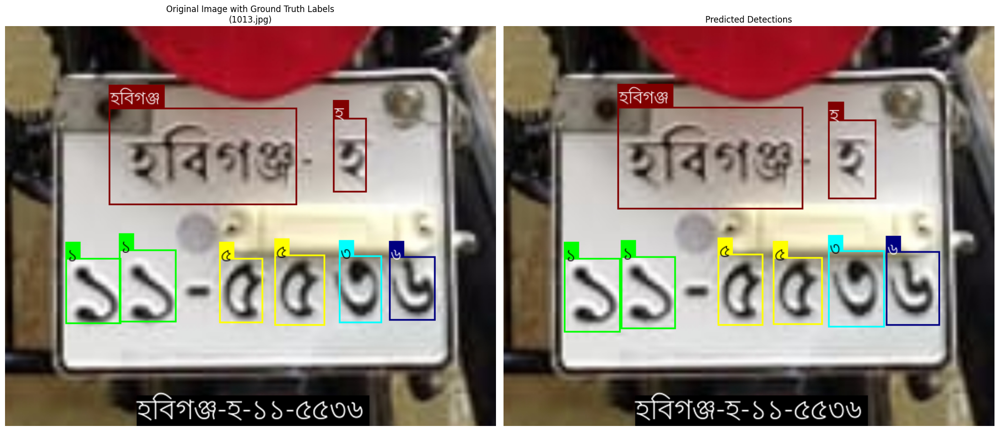


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/img-to-text/test/images/2340.jpg: 416x640 4 1s, 1 6, 1 8, 1 Metro, 1 Dhaka, 8.7ms
Speed: 1.1ms preprocess, 8.7ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 640)


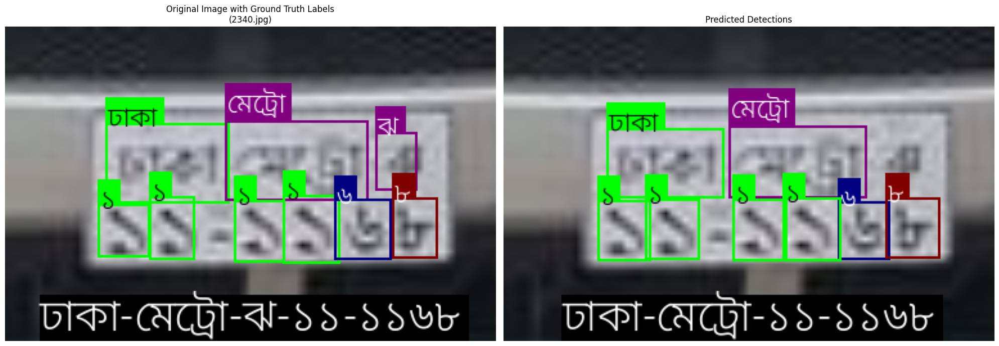


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/img-to-text/test/images/1568.jpg: 512x640 2 1s, 1 2, 1 4, 2 5s, 1 H, 1 Sirajganj, 8.3ms
Speed: 1.3ms preprocess, 8.3ms inference, 1.8ms postprocess per image at shape (1, 3, 512, 640)


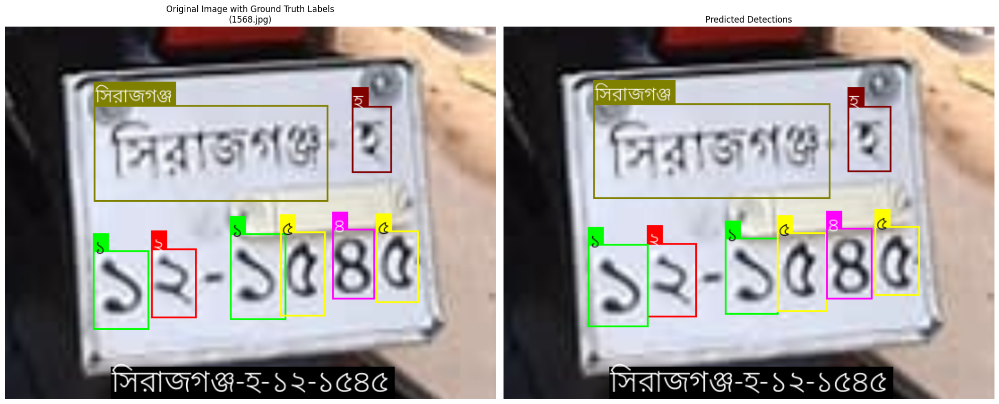


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/img-to-text/test/images/1788.jpg: 384x640 2 1s, 2 3s, 1 5, 1 8, 1 Metro, 1 Ch, 1 Dhaka, 8.9ms
Speed: 0.9ms preprocess, 8.9ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


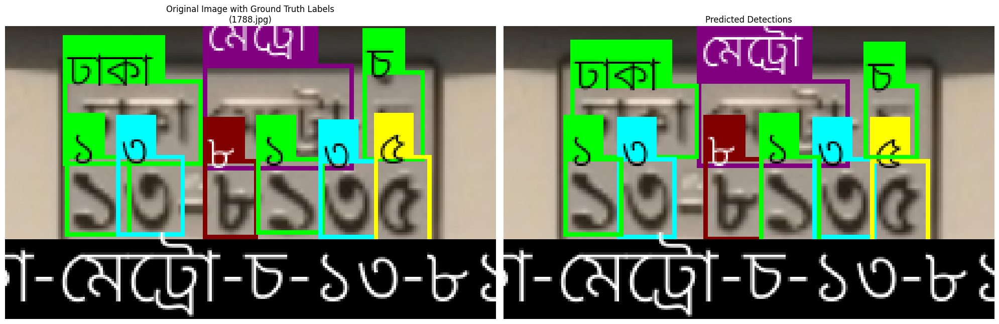


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/img-to-text/test/images/2298.jpg: 448x640 4 1s, 1 4, 1 6, 1 L, 1 Jamalpur, 9.1ms
Speed: 1.3ms preprocess, 9.1ms inference, 0.8ms postprocess per image at shape (1, 3, 448, 640)


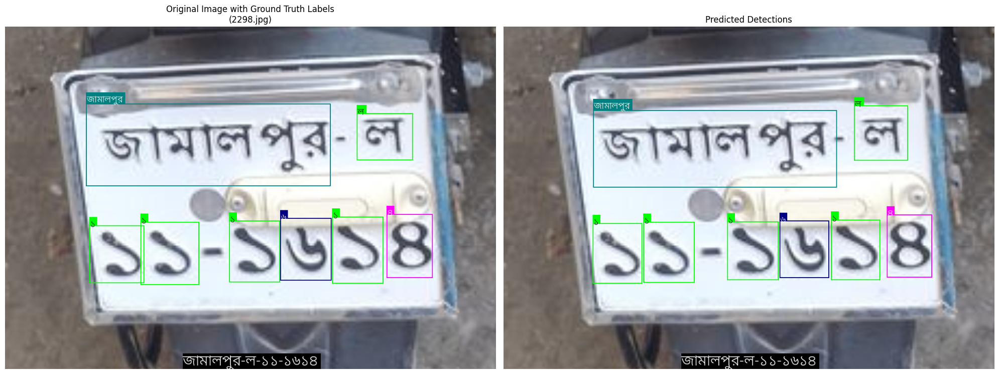


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/img-to-text/test/images/543.jpg: 512x640 1 3, 1 4, 1 5, 1 6, 1 7, 1 8, 1 D, 1 S, 1 Dinajpur, 8.4ms
Speed: 1.2ms preprocess, 8.4ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 640)


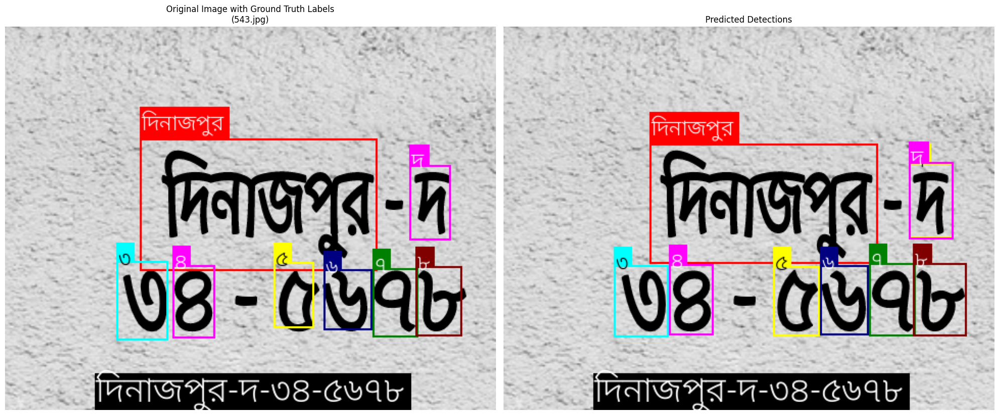


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/img-to-text/test/images/700.jpg: 512x640 1 0, 2 1s, 1 2, 2 9s, 1 G, 1 Pirojpur, 7.9ms
Speed: 1.2ms preprocess, 7.9ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 640)


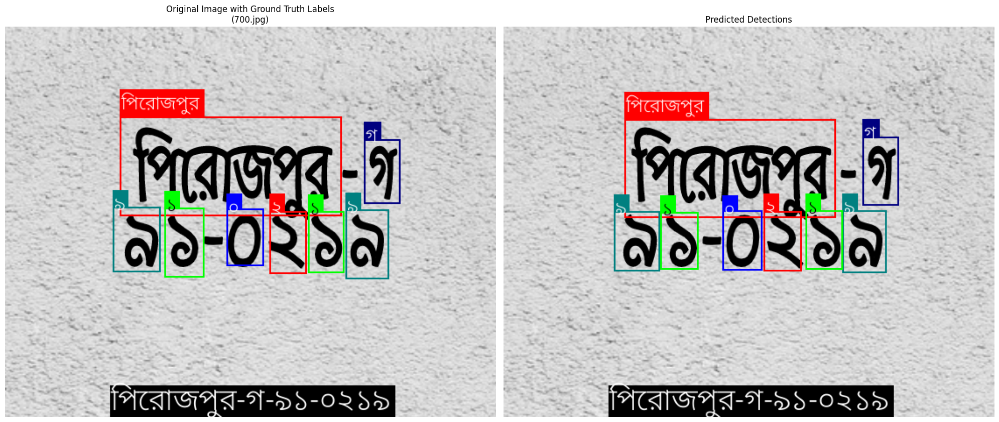


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/img-to-text/test/images/1863.jpg: 352x640 1 3, 2 5s, 1 6, 1 8, 1 9, 1 Metro, 1 G, 1 Dhaka, 8.6ms
Speed: 1.0ms preprocess, 8.6ms inference, 1.1ms postprocess per image at shape (1, 3, 352, 640)


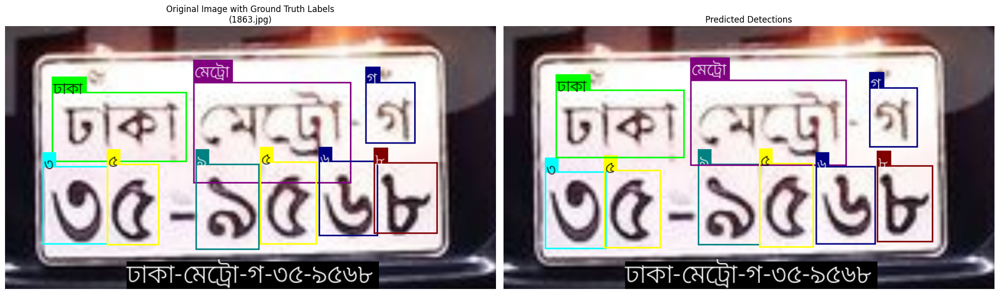


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/img-to-text/test/images/1910.jpg: 384x640 1 0, 2 1s, 1 3, 1 5, 1 8, 1 Metro, 1 Gh, 1 H, 1 Dhaka, 8.4ms
Speed: 1.0ms preprocess, 8.4ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


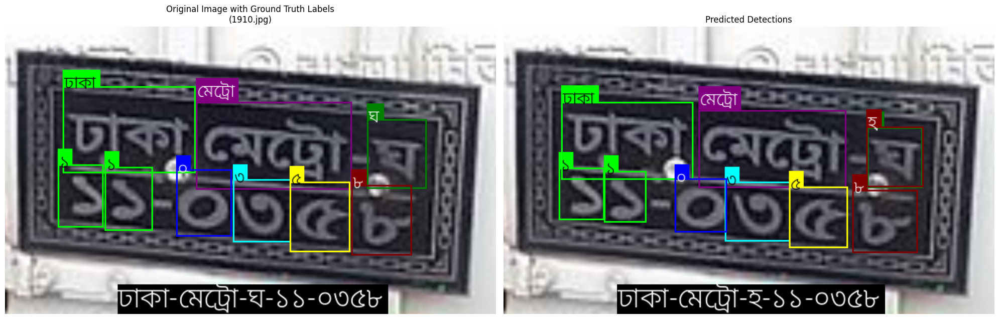


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/img-to-text/test/images/1821.jpg: 544x640 3 3s, 1 4, 1 5, 1 9, 1 Metro, 1 H, 1 Dhaka, 8.4ms
Speed: 1.3ms preprocess, 8.4ms inference, 0.8ms postprocess per image at shape (1, 3, 544, 640)


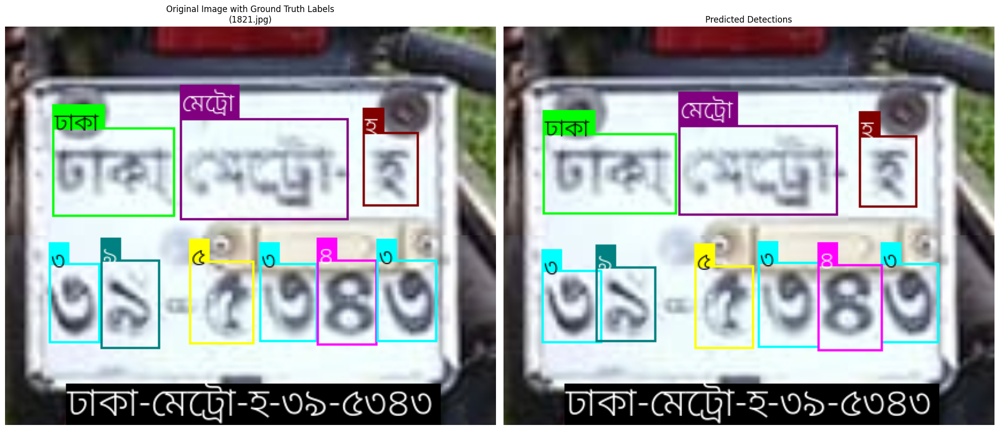


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/img-to-text/test/images/1527.jpg: 480x640 1 0, 2 1s, 1 2, 1 6, 1 7, 1 9, 1 H, 1 Nilphamari, 8.2ms
Speed: 1.6ms preprocess, 8.2ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)


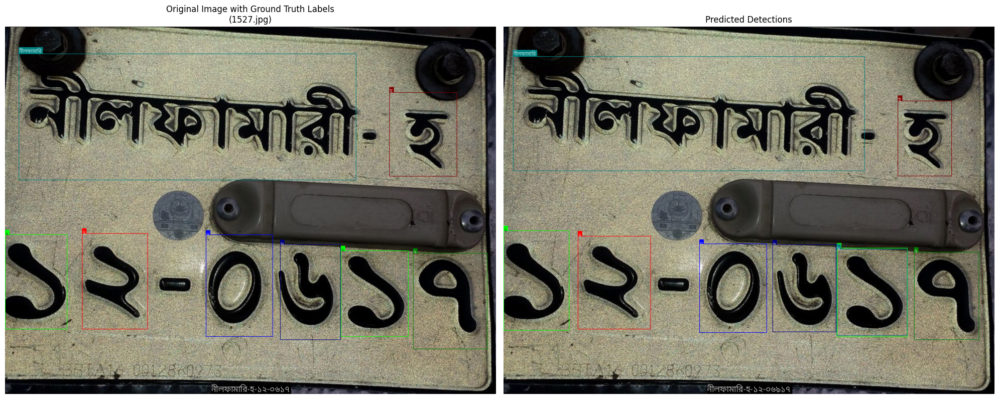


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/img-to-text/test/images/2312.jpg: 448x640 1 0, 1 1, 1 2, 1 4, 1 8, 1 9, 1 Metro, 1 G, 2 Dhakas, 8.0ms
Speed: 1.0ms preprocess, 8.0ms inference, 0.8ms postprocess per image at shape (1, 3, 448, 640)


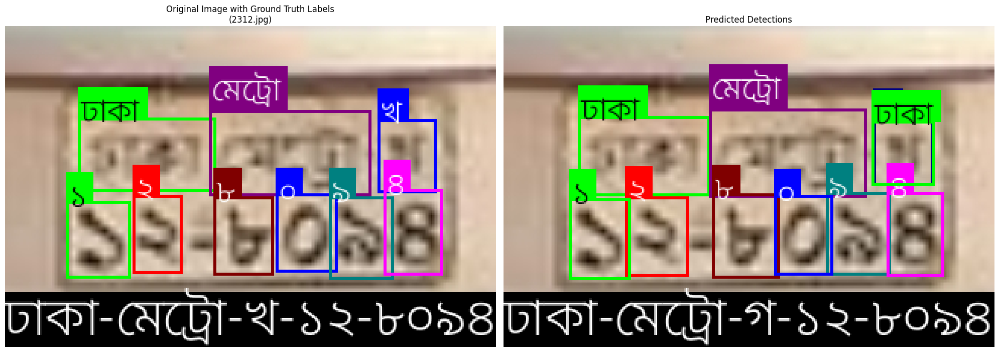


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/img-to-text/test/images/1441.jpg: 576x640 1 1, 1 9, 2 Ls, 1 Madaripur, 1 Manikganj, 9.5ms
Speed: 1.4ms preprocess, 9.5ms inference, 0.8ms postprocess per image at shape (1, 3, 576, 640)


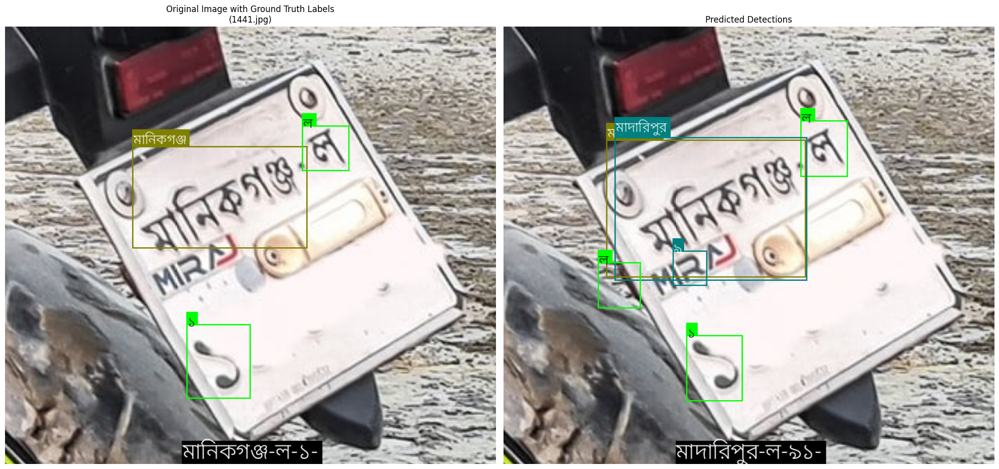


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/img-to-text/test/images/1685.jpg: 544x640 2 1s, 1 2, 1 3, 1 5, 1 6, 1 H, 1 Lakshmipur, 8.0ms
Speed: 1.3ms preprocess, 8.0ms inference, 0.8ms postprocess per image at shape (1, 3, 544, 640)


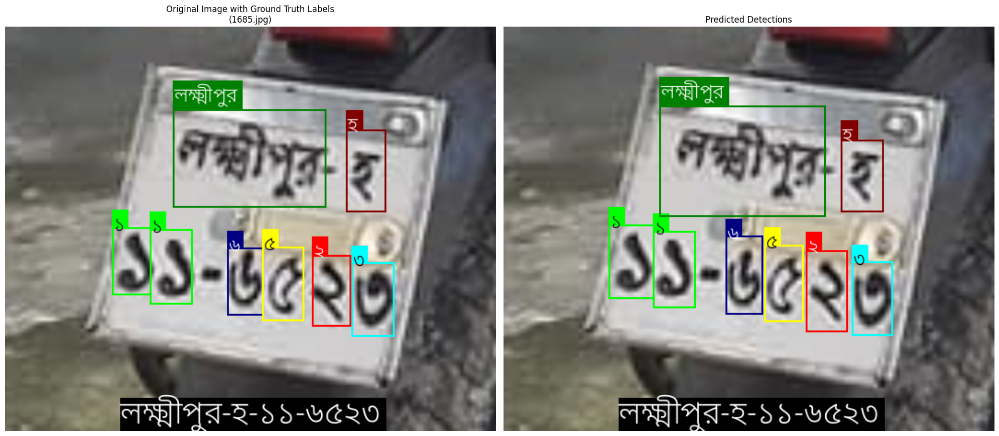


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/img-to-text/test/images/524.jpg: 480x640 1 3, 1 4, 1 5, 1 6, 1 7, 1 8, 1 Chh, 1 Dhaka, 8.2ms
Speed: 1.3ms preprocess, 8.2ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)


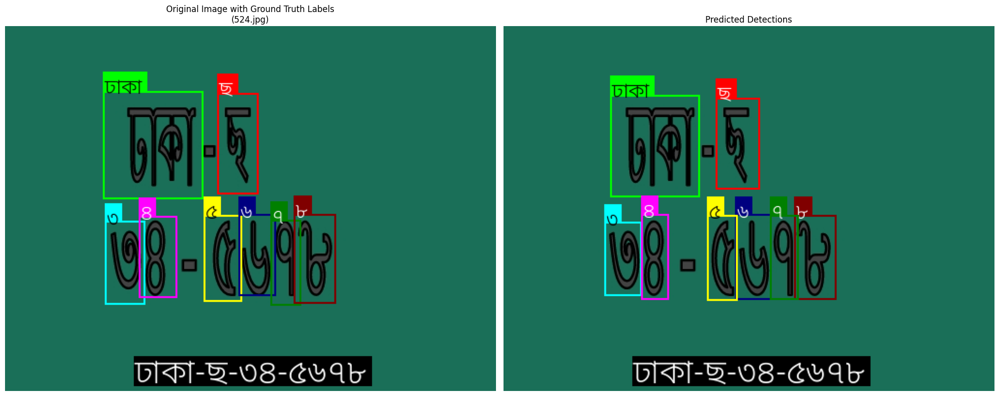


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/img-to-text/test/images/1087.jpg: 288x640 2 0s, 1 1, 1 7, 1 8, 1 9, 1 S, 1 Joypurhat, 8.9ms
Speed: 0.8ms preprocess, 8.9ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 640)


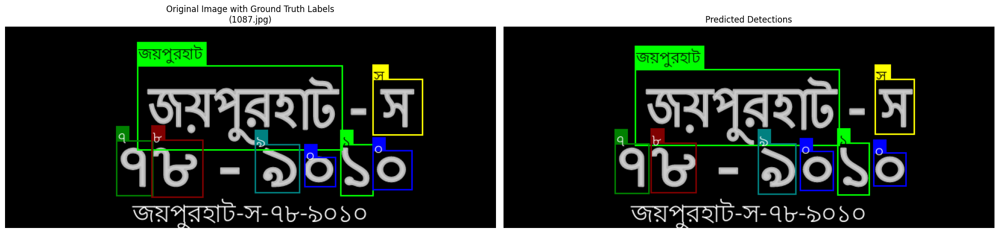


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/img-to-text/test/images/1043.jpg: 416x640 1 0, 1 1, 1 3, 1 4, 1 5, 1 6, 1 M, 1 Sylhet, 8.0ms
Speed: 1.0ms preprocess, 8.0ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)


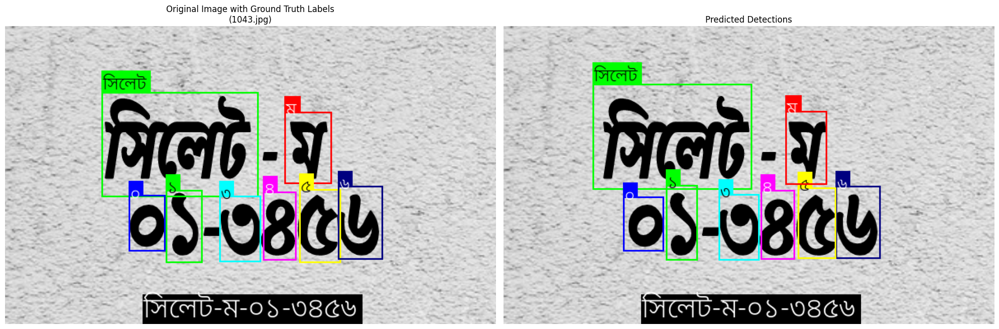


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/img-to-text/test/images/2252.jpg: 480x640 1 1, 1 2, 2 3s, 1 4, 1 5, 1 Metro, 1 L, 1 Dhaka, 9.1ms
Speed: 1.2ms preprocess, 9.1ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)


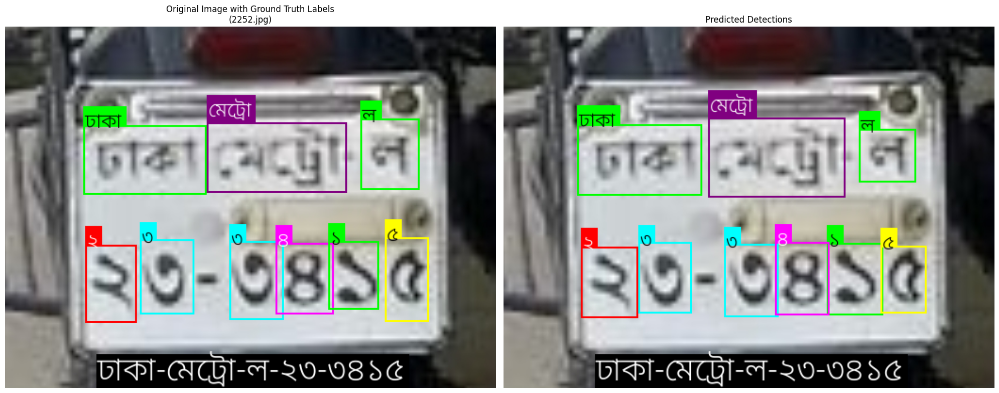


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/img-to-text/test/images/311.jpg: 384x640 2 1s, 2 4s, 1 6, 1 9, 1 Metro, 1 G, 1 Dhaka, 8.3ms
Speed: 0.9ms preprocess, 8.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


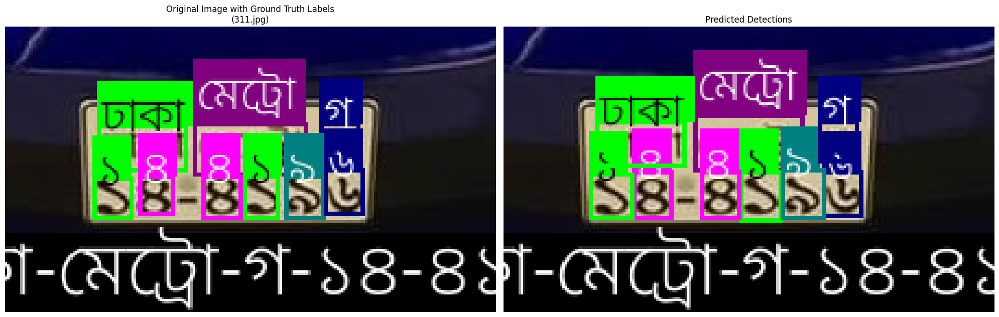


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/img-to-text/test/images/1137.jpg: 576x640 1 1, 1 2, 1 3, 1 4, 1 5, 1 6, 1 Th, 1 Kishoreganj, 9.4ms
Speed: 1.9ms preprocess, 9.4ms inference, 0.9ms postprocess per image at shape (1, 3, 576, 640)


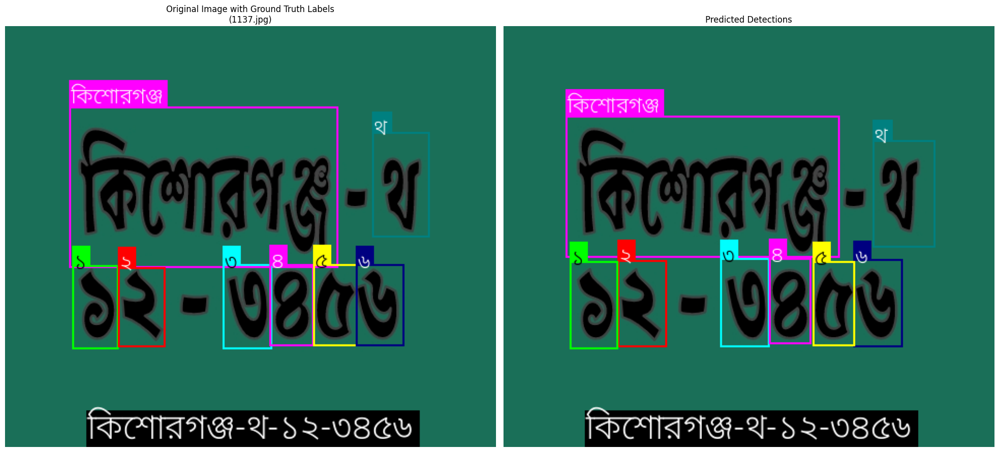


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/img-to-text/test/images/396.jpg: 288x640 1 0, 1 5, 1 6, 1 7, 1 8, 1 9, 1 Do, 1 Bandarban, 8.1ms
Speed: 0.8ms preprocess, 8.1ms inference, 0.8ms postprocess per image at shape (1, 3, 288, 640)


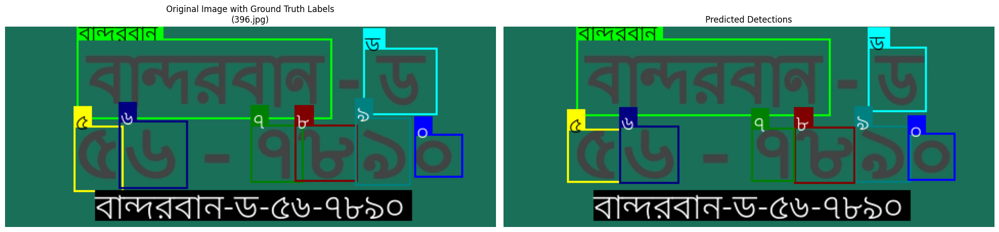


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/img-to-text/test/images/428.jpg: 352x640 1 1, 1 2, 1 3, 1 4, 1 5, 1 6, 1 E, 1 Borguna, 7.9ms
Speed: 0.9ms preprocess, 7.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 640)


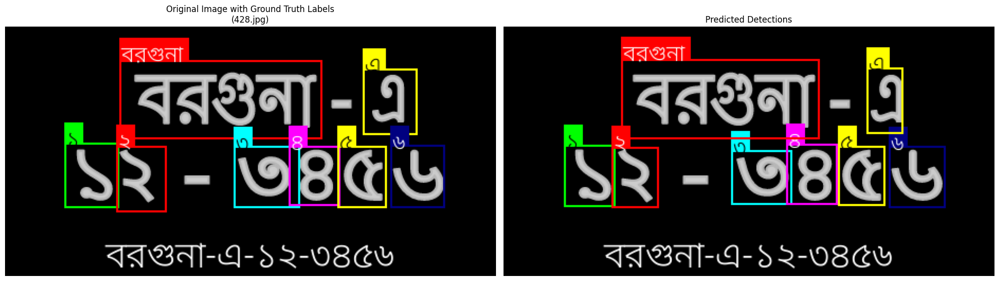


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/img-to-text/test/images/670.jpg: 352x640 3 1s, 1 2, 1 8, 1 9, 1 J, 1 Pabna, 8.9ms
Speed: 1.5ms preprocess, 8.9ms inference, 0.9ms postprocess per image at shape (1, 3, 352, 640)


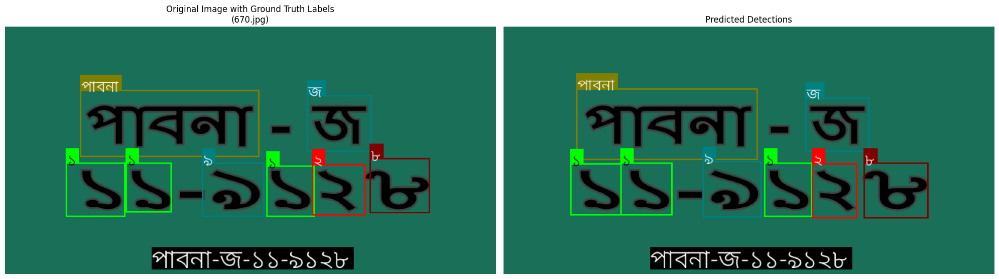


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/img-to-text/test/images/2243.jpg: 352x640 1 1, 2 2s, 2 4s, 1 5, 1 9, 1 Metro, 1 T, 1 Dhaka, 1 Dh, 7.8ms
Speed: 1.7ms preprocess, 7.8ms inference, 0.9ms postprocess per image at shape (1, 3, 352, 640)


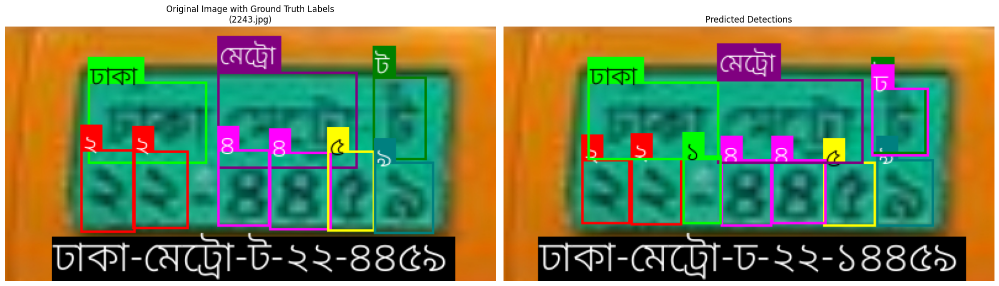


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/img-to-text/test/images/1557.jpg: 384x640 1 0, 2 1s, 2 2s, 1 8, 1 L, 1 Sherpur, 9.1ms
Speed: 1.3ms preprocess, 9.1ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


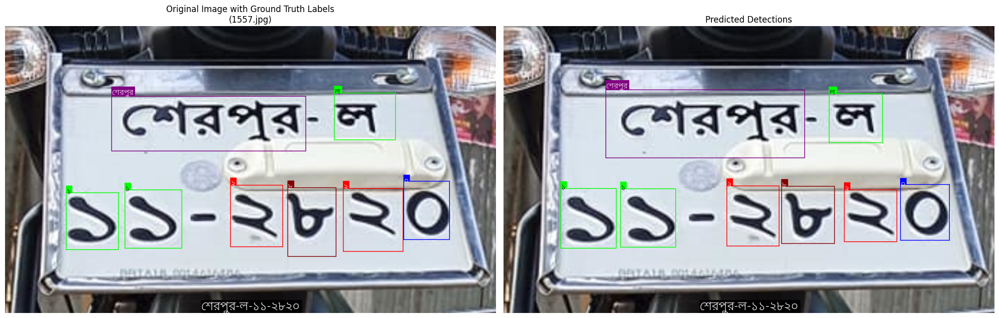

In [10]:
%matplotlib inline
for img_path in test_image_files:
    img_filename = os.path.basename(img_path)
    img_name_no_ext = os.path.splitext(img_filename)[0]
    label_path = os.path.join(TEST_LABELS_DIR, img_name_no_ext + '.txt')

    original_image = cv2.imread(img_path)
    original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

    ground_truth_annotations = []
    ground_truth_car_number = []
    ground_truth_car_area = ""
    ground_truth_car_metro = ""
    ground_truth_car_letter = ""

    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            for line in f:
                parts = list(map(float, line.strip().split()))
                ground_truth_annotations.append(parts)

                cls_id, x_center, y_center, width, height = parts[:5]
                cls_id = int(cls_id)

                if cls_id < 10:
                    ground_truth_car_number.append({'x_center': x_center, 'class_id': bangla_anote[str(cls_id)]})
                elif cls_id == 10:
                    ground_truth_car_metro = bangla_anote[str(cls_id)] + '-'
                elif (10 < cls_id < 35) or (99 < cls_id < 102):
                    ground_truth_car_letter = bangla_anote[str(cls_id)] + '-'
                else:
                    ground_truth_car_area = bangla_anote[str(cls_id)] + '-'

        ground_truth_car_number.sort(key=lambda item: item['x_center'])
        ground_truth_car_number = "".join(str(item['class_id']) for item in ground_truth_car_number)
        ground_truth_car_number_plate = ground_truth_car_area + ground_truth_car_metro + ground_truth_car_letter + ground_truth_car_number[:2] + '-' + ground_truth_car_number[2:]
    else:
        ground_truth_car_number_plate = ""
        
    ground_truth_image_display = draw_annotations(original_image.copy(), ground_truth_annotations, class_names, is_gt=True, title_text=ground_truth_car_number_plate)

    prediction_results = trained_model.predict(
        source=img_path,
        imgsz=IMG_SIZE,
        conf=CONF_THRESHOLD,
        iou=IOU_THRESHOLD,
        # save=True,  # No longer saving predicted images
        # save_txt=True, # No longer saving predicted labels to file
        project=PREDICT_PROJECT_NAME,
        name=PREDICT_RUN_NAME,
        exist_ok=True,
        line_width=1,
        show_conf=False,
    )

    # Extract predicted annotations from the results
    predicted_annotations = []
    predicted_car_number = []
    predicted_car_area = ""
    predicted_car_metro = ""
    predicted_car_letter = ""
    if prediction_results and len(prediction_results) > 0:
        # Assuming single image prediction, take the first result
        res = prediction_results[0]
        if res.boxes:
            for *xywh, conf, cls_id in res.boxes.data.tolist():
                # Convert xyxy (from res.boxes.data) to normalized xywh for draw_annotations
                # YOLO output is typically x_min, y_min, x_max, y_max (xyxy)
                # We need x_center, y_center, width, height (normalized)
                img_h, img_w, _ = original_image.shape
                x_min, y_min, x_max, y_max = xywh
                
                # Convert to normalized (0-1) coordinates
                x_center = ((x_min + x_max) / 2) / img_w
                y_center = ((y_min + y_max) / 2) / img_h
                width = (x_max - x_min) / img_w
                height = (y_max - y_min) / img_h
                cls_id = int(cls_id)

                predicted_annotations.append([int(cls_id), x_center, y_center, width, height, conf])
                if int(cls_id) < 10:
                    predicted_car_number.append({'x_center': x_center, 'class_id': bangla_anote[str(cls_id)]})
                elif int(cls_id) == 10:
                    predicted_car_metro = bangla_anote[str(cls_id)]+ '-'
                elif (10 < int(cls_id) < 35) or (99 < int(cls_id) < 102):
                    predicted_car_letter = bangla_anote[str(cls_id)]+ '-'
                else:
                    predicted_car_area = bangla_anote[str(cls_id)] + '-'
                    
    predicted_car_number.sort(key=lambda item: item['x_center'])
    predicted_car_number= "".join(str(item['class_id']) for item in predicted_car_number)
    predicted_car_number_plate = predicted_car_area + predicted_car_metro + predicted_car_letter + predicted_car_number[:2] + '-' + predicted_car_number[2:]
                
    predicted_image_display = draw_annotations(original_image.copy(), predicted_annotations, class_names, is_gt=False, title_text=predicted_car_number_plate) # Red for predictions

    fig, axes = plt.subplots(1, 2, figsize=(20, 10))
    axes[0].imshow(ground_truth_image_display)
    axes[0].set_title(f'Original Image with Ground Truth Labels\n({img_filename})')
    axes[0].axis('off')

    axes[1].imshow(predicted_image_display)
    axes[1].set_title(f'Predicted Detections')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()